In [15]:
!pip install librosa

  Using cached librosa-0.10.2.post1-py3-none-any.whl.metadata (8.6 kB)
  Using cached audioread-3.0.1-py3-none-any.whl.metadata (8.4 kB)
  Using cached soundfile-0.12.1-py2.py3-none-win_amd64.whl.metadata (14 kB)
  Using cached pooch-1.8.2-py3-none-any.whl.metadata (10 kB)
  Using cached soxr-0.5.0.post1-cp312-abi3-win_amd64.whl.metadata (5.6 kB)
Using cached librosa-0.10.2.post1-py3-none-any.whl (260 kB)
Using cached audioread-3.0.1-py3-none-any.whl (23 kB)
Using cached pooch-1.8.2-py3-none-any.whl (64 kB)
Using cached soundfile-0.12.1-py2.py3-none-win_amd64.whl (1.0 MB)
Using cached soxr-0.5.0.post1-cp312-abi3-win_amd64.whl (164 kB)


In [7]:
import kagglehub

# Download latest version
path = kagglehub.dataset_download("andradaolteanu/gtzan-dataset-music-genre-classification")

print("Path to dataset files:", path)

Resuming download from 932184064 bytes (369308431 bytes left)...
Resuming download from https://www.kaggle.com/api/v1/datasets/download/andradaolteanu/gtzan-dataset-music-genre-classification?dataset_version_number=1 (932184064/1301492495) bytes left.


100%|██████████| 1.21G/1.21G [01:47<00:00, 3.44MB/s]

Extracting files...


Path to dataset files: C:\Users\KodavatiGeetanjali\.cache\kagglehub\datasets\andradaolteanu\gtzan-dataset-music-genre-classification\versions\1


# Importing Libraries

In [16]:
import os
import librosa
import matplotlib.pyplot as plt
import tensorflow as tf
import numpy as np

import warnings
warnings.filterwarnings('ignore')

# Visualizing the Audio

In [ ]:
random_file_name = r"kagglehub\datasets\andradaolteanu\gtzan-dataset-music-genre-classification\versions\1\Data\genres_original\blues\blues.00000.wav"
y, sr = librosa.load(random_file_name, sr=44100) #sr is sampling rate
y.shape, sr

((1323588,), 44100)

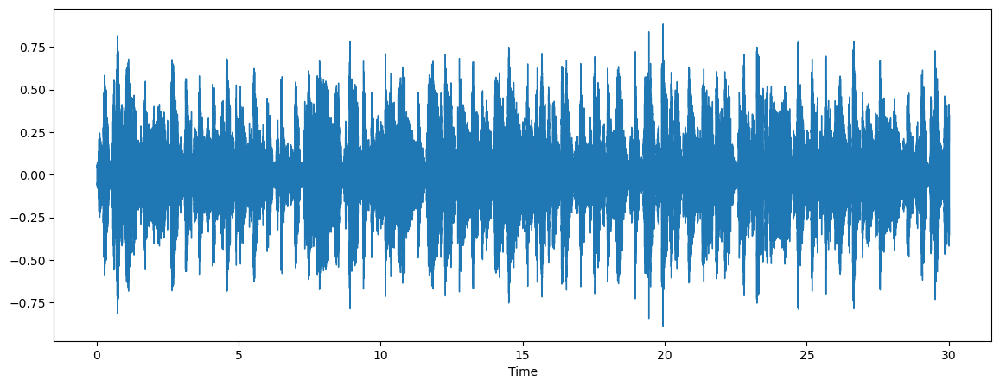

In [19]:
#Blues
plt.figure(figsize=(14, 5))
librosa.display.waveshow(y, sr=sr)

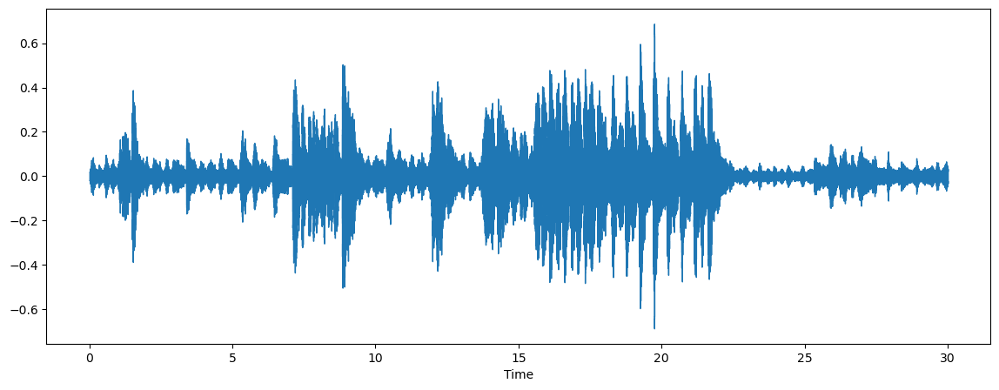

In [ ]:
#jazz
random_file_name1 = r".cache\kagglehub\datasets\andradaolteanu\gtzan-dataset-music-genre-classification\versions\1\Data\genres_original\jazz\jazz.00000.wav"
y1, sr1 = librosa.load(random_file_name1, sr=44100)
plt.figure(figsize=(14, 5))
librosa.display.waveshow(y1, sr=sr1)

The Audio Signal is for 30 secs

# Play Sound

In [23]:
#Blues
from IPython.display import Audio
Audio(data=y, rate=sr)

In [24]:
#Jazz
from IPython.display import Audio
Audio(data=y1, rate=sr1)

# Doing Visualization on chuncks of Audio

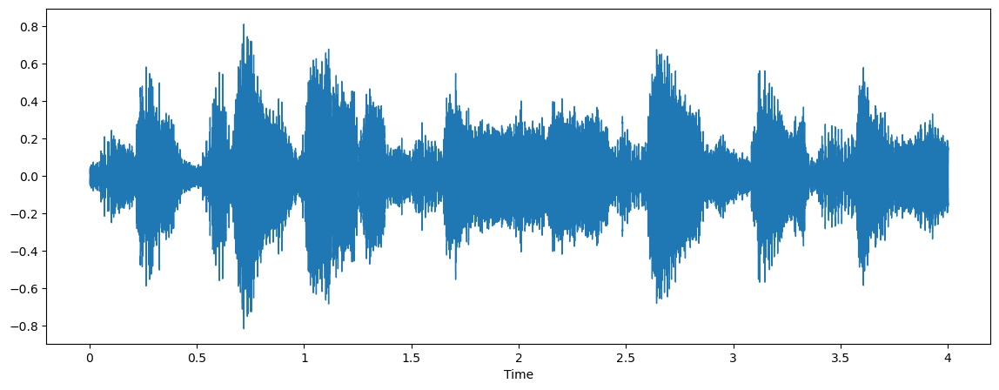

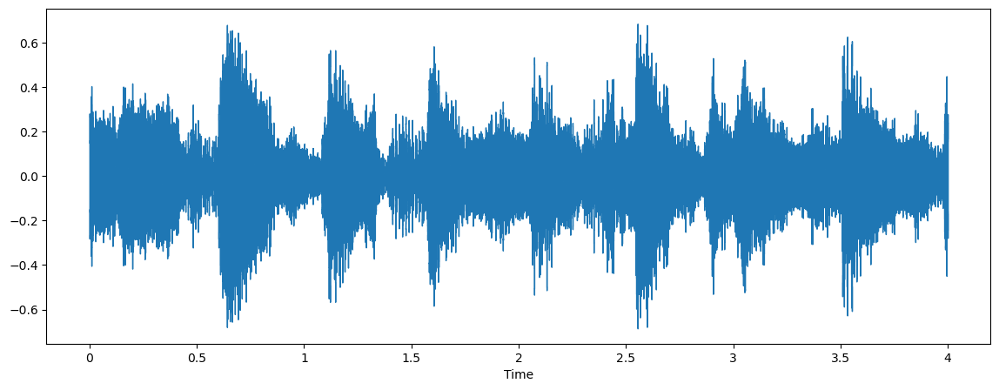

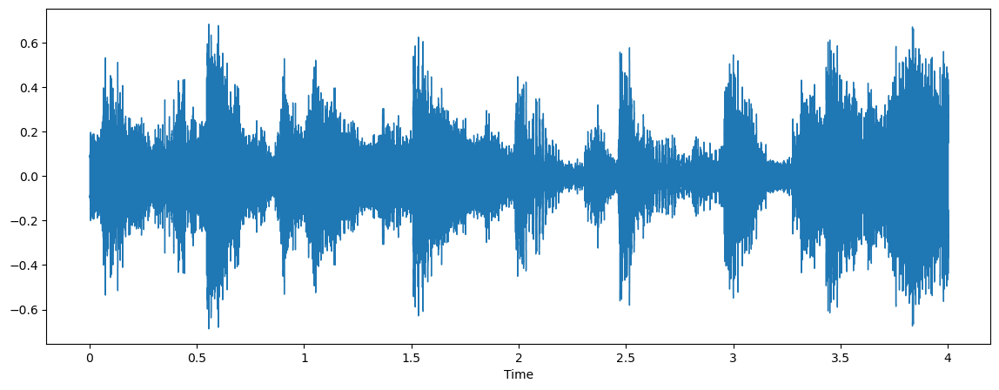

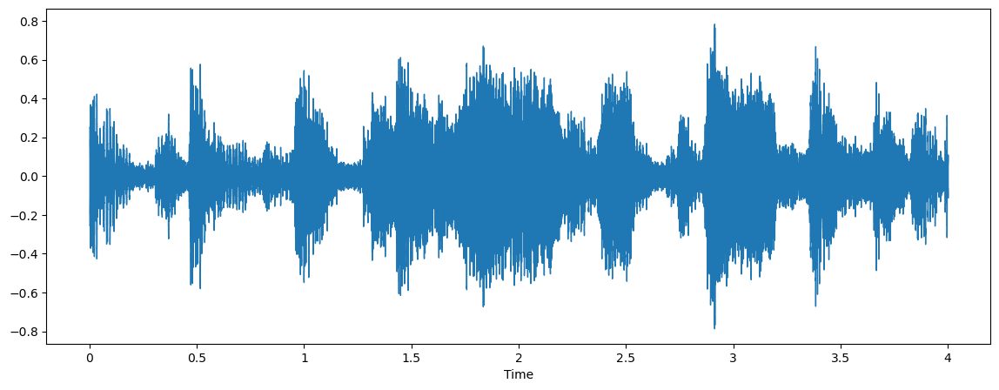

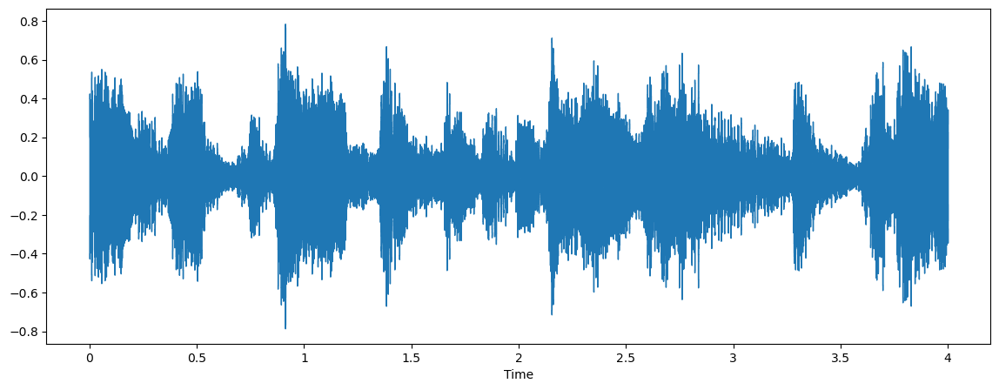

...

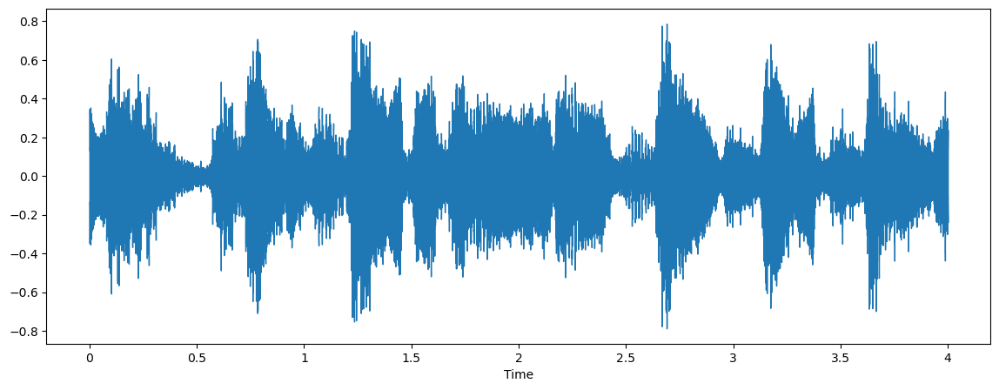

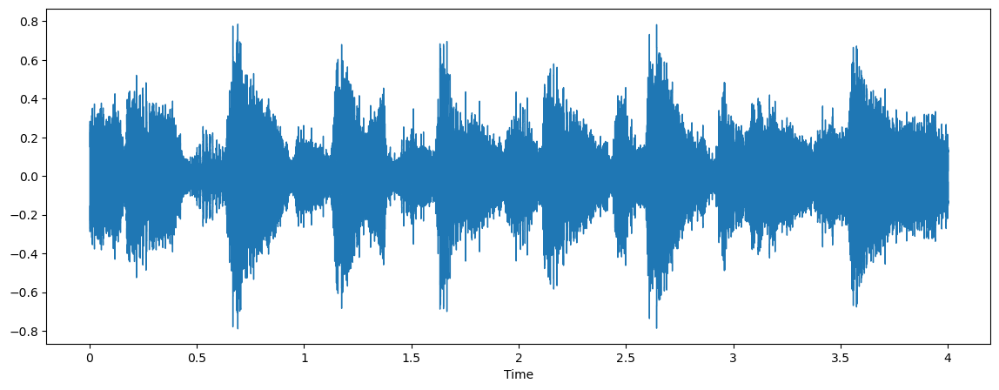

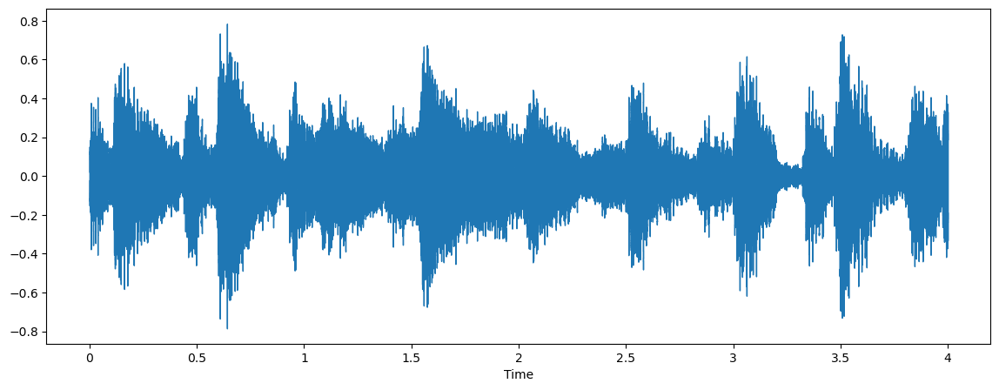

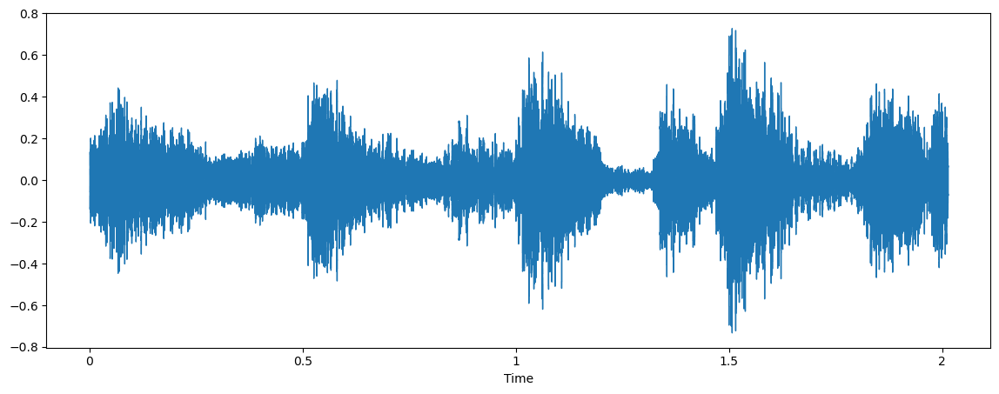

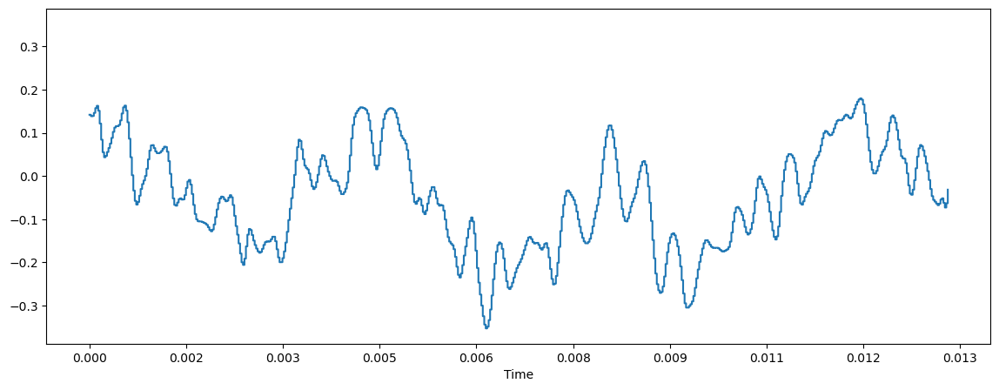

In [ ]:
audio_path = r"kagglehub\datasets\andradaolteanu\gtzan-dataset-music-genre-classification\versions\1\Data\genres_original\blues\blues.00000.wav"
y, sr = librosa.load(random_file_name, sr=44100)

#define the duration of chunk and overlap
chunk_duration = 4
overlap_duration = 2

#Convert duration to sample
chunk_samples = int(chunk_duration * sr)
overlap_samples = int(overlap_duration * sr)

#Calculate the number of chunks
num_chunks = int(np.ceil(len(y) / (chunk_samples - overlap_samples)))

#iterate over each chunck and plot a graph
for i in range(num_chunks):
  #Calculate start and end indices of the chunk
  start_sample = i * (chunk_samples - overlap_samples)
  end_sample = start_sample + chunk_samples
  #Extract the chinck audio
  chunk = y[start_sample:end_sample]
  #plot graph
  plt.figure(figsize=(14, 5))
  librosa.display.waveshow(chunk, sr=sr)
  plt.show()

# Melspectogram Visulaization

In [27]:
#Plotting the Melscpectogram of Entire Audio
def plot_melspectogram(audio_path):
  y, sr = librosa.load(audio_path, sr=44100)
  #Compute Spectogram
  spectogram = librosa.feature.melspectrogram(y=y, sr=sr, n_mels=128, fmax=8000)
  #Convert to decibels (log scale)
  spectogram_db = librosa.power_to_db(spectogram, ref=np.max)
  #Visualize the spectogram
  plt.figure(figsize=(14, 5))
  librosa.display.specshow(spectogram_db, sr=sr, x_axis='time', y_axis='mel')
  plt.colorbar(format='%+2.0f dB')
  plt.title('Melspectogram')
  plt.tight_layout
  plt.show()

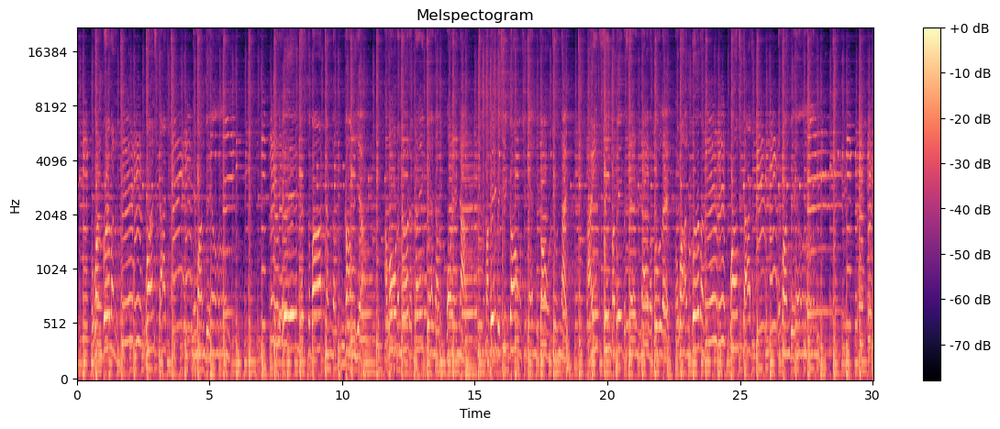

In [28]:
plot_melspectogram(random_file_name)

In [29]:
def plot_melspectogram_chunks(audio_path):
  y, sr = librosa.load(audio_path, sr=44100)
  chunk_duration = 4
  overlap_duration = 2
  
  chunk_samples = int(chunk_duration * sr)
  overlap_samples = int(overlap_duration * sr)

  num_chunks = int(np.ceil(len(y) / (chunk_samples - overlap_samples)))
  
  for i in range(num_chunks):
    start_sample = i * (chunk_samples - overlap_samples)
    end_sample = start_sample + chunk_samples
    chunk = y[start_sample:end_sample]
    #plot melspectogram
    spectrogram = librosa.feature.melspectrogram(y=chunk, sr=sr, n_mels=128, fmax=8000)
    spectrogram_db = librosa.power_to_db(spectrogram, ref=np.max)
    plt.figure(figsize=(14, 5))
    librosa.display.specshow(spectrogram_db, sr=sr, x_axis='time', y_axis='mel', cmap='gray_r')
    plt.colorbar(format='%+2.0f dB')
    plt.title('Spectrogram')
    plt.tight_layout
    plt.show()
    print(spectrogram.shape)

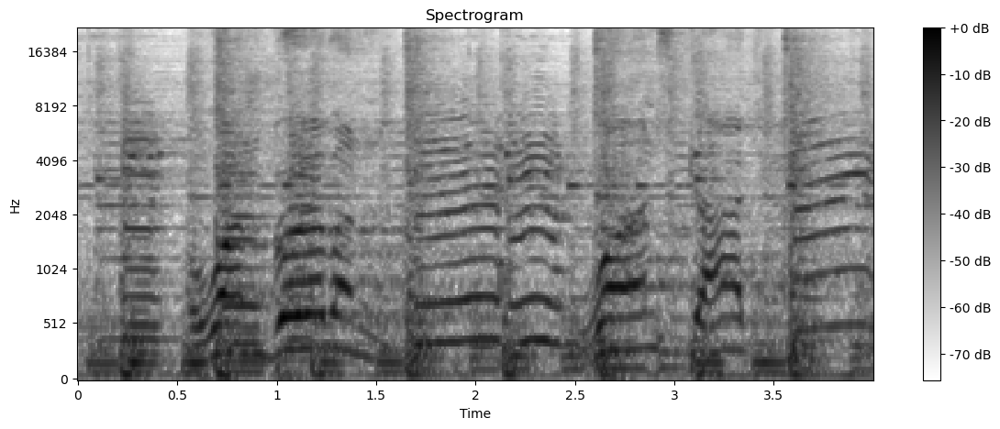

(128, 345)


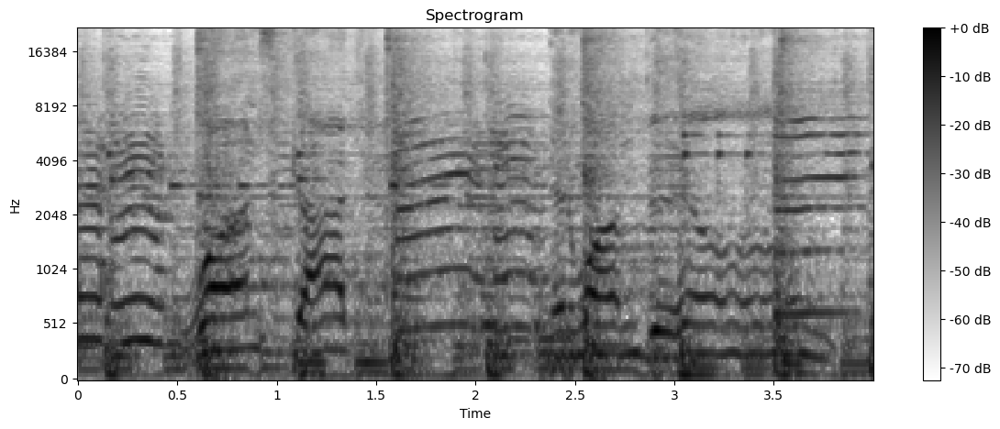

(128, 345)


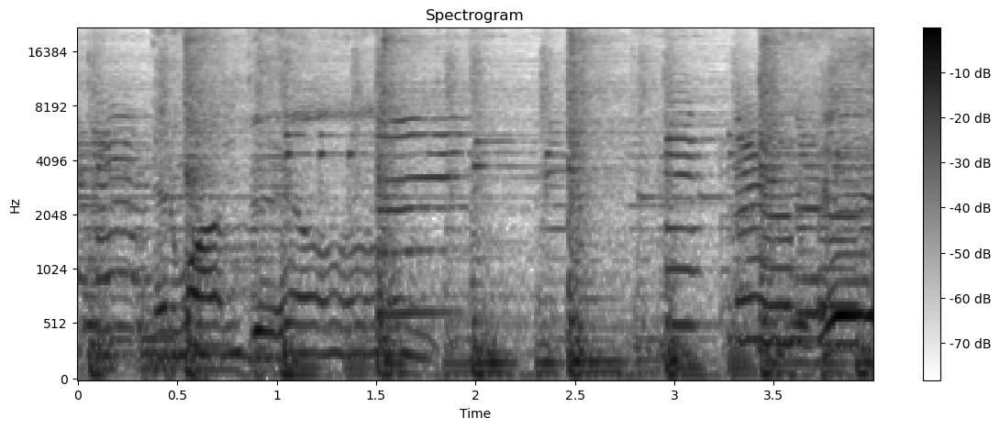

(128, 345)


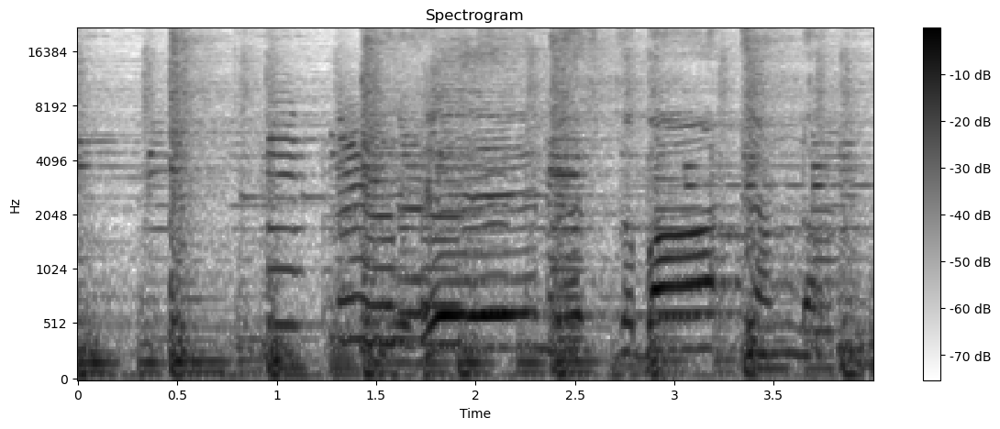

(128, 345)


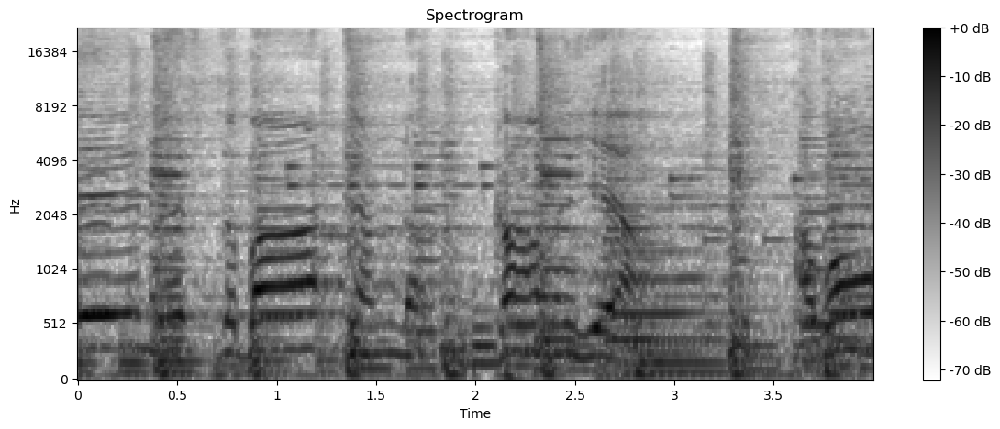

(128, 345)


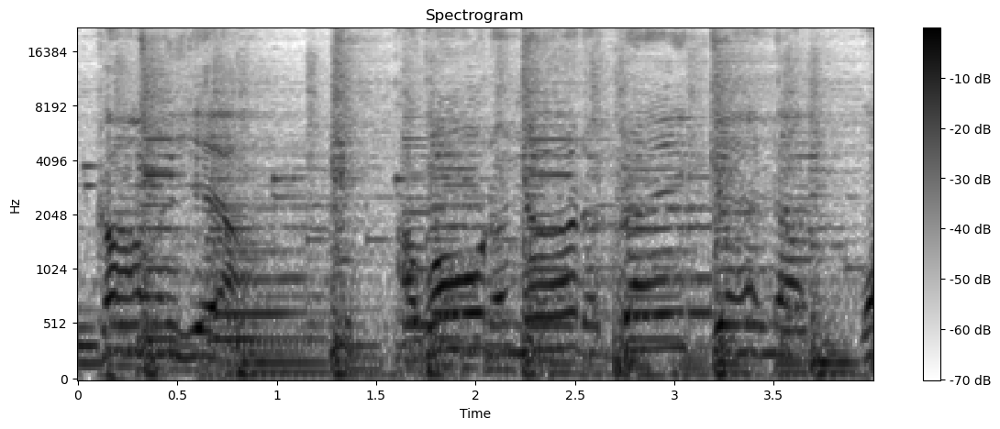

(128, 345)


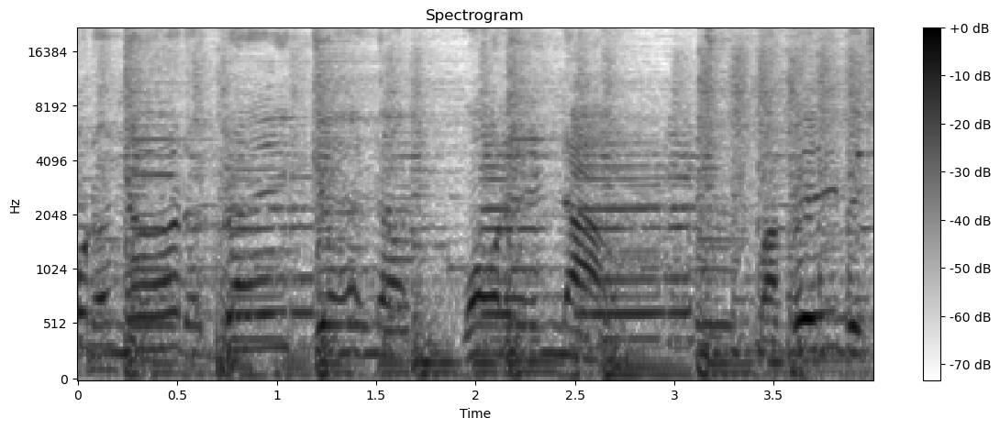

(128, 345)


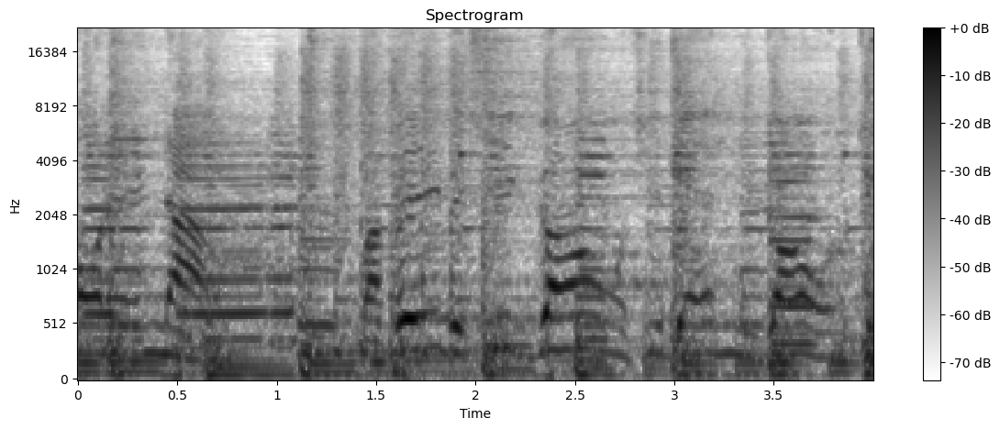

(128, 345)


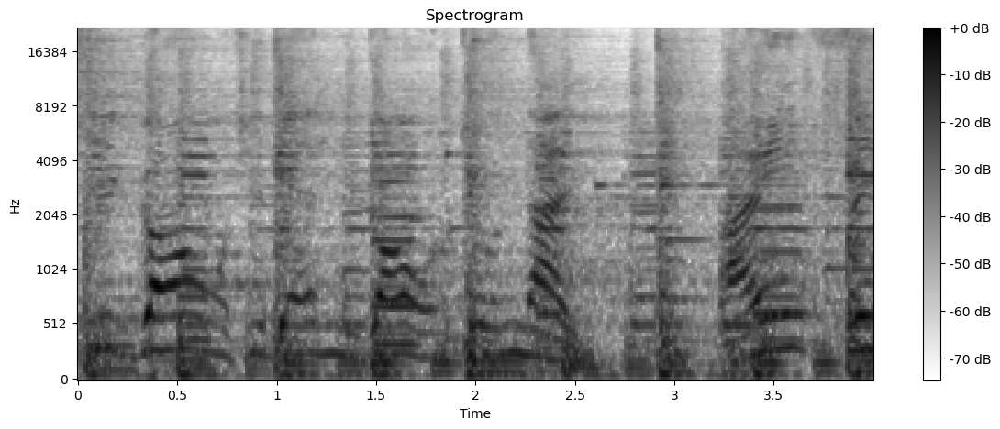

(128, 345)


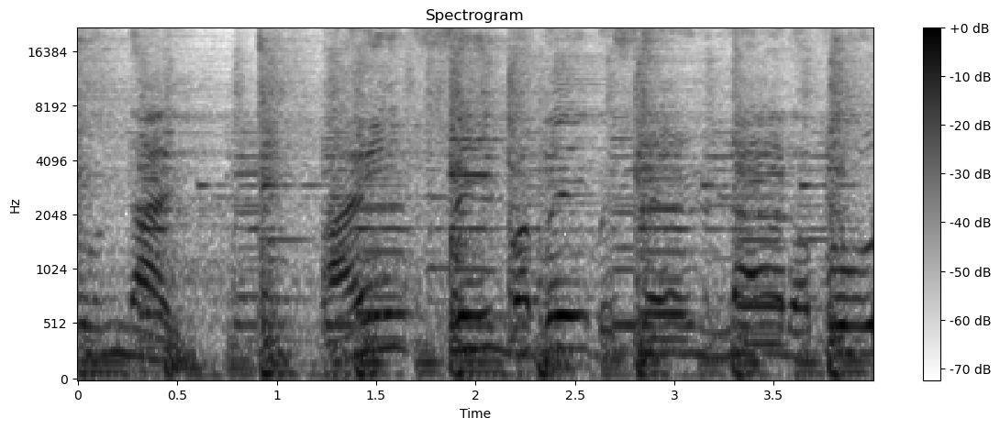

(128, 345)


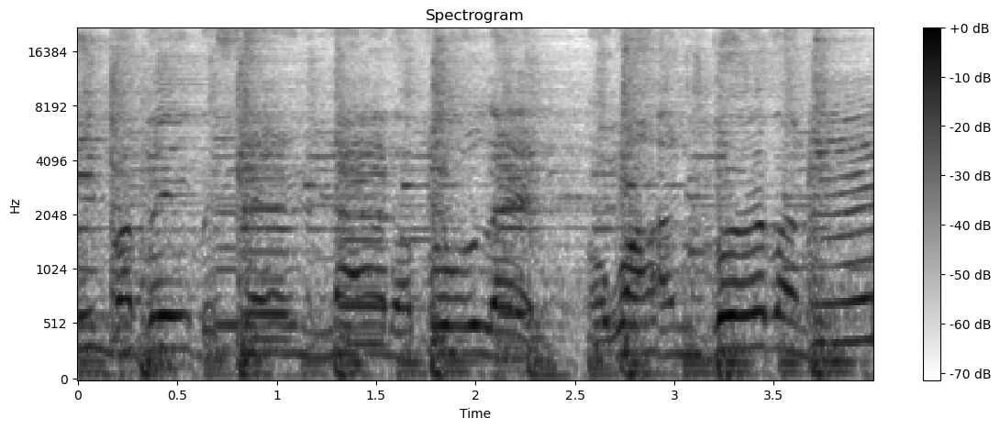

(128, 345)


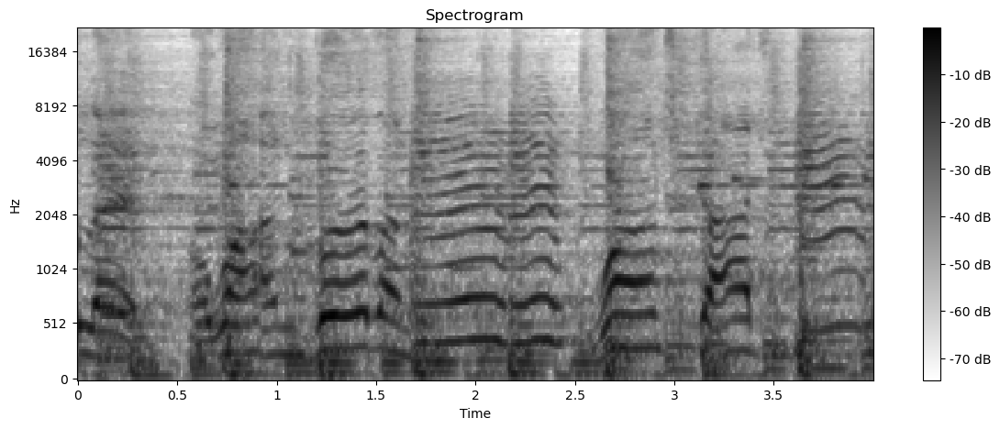

(128, 345)


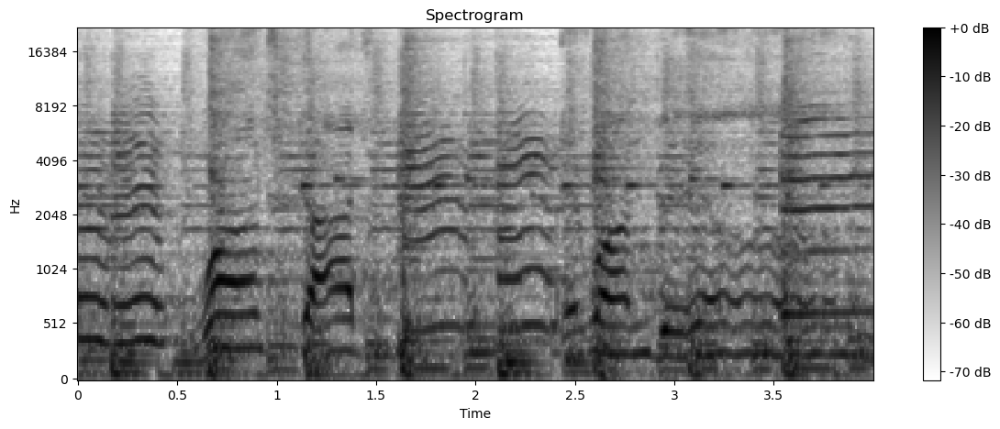

(128, 345)


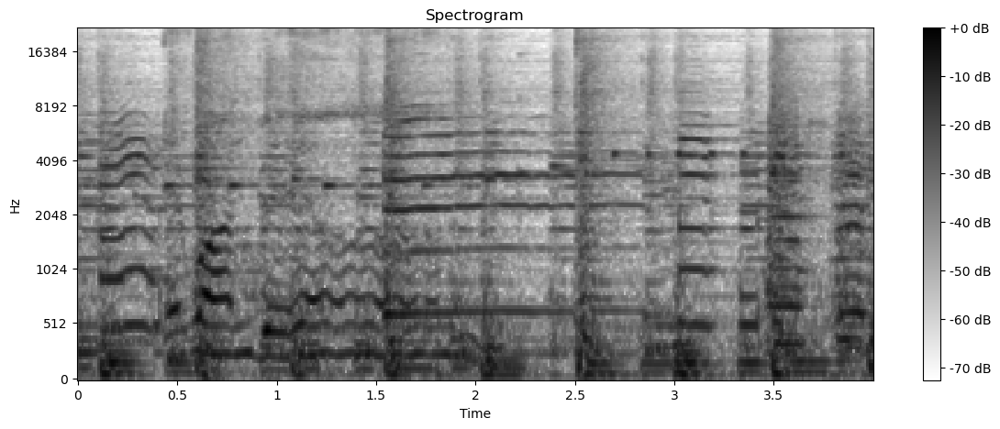

(128, 345)


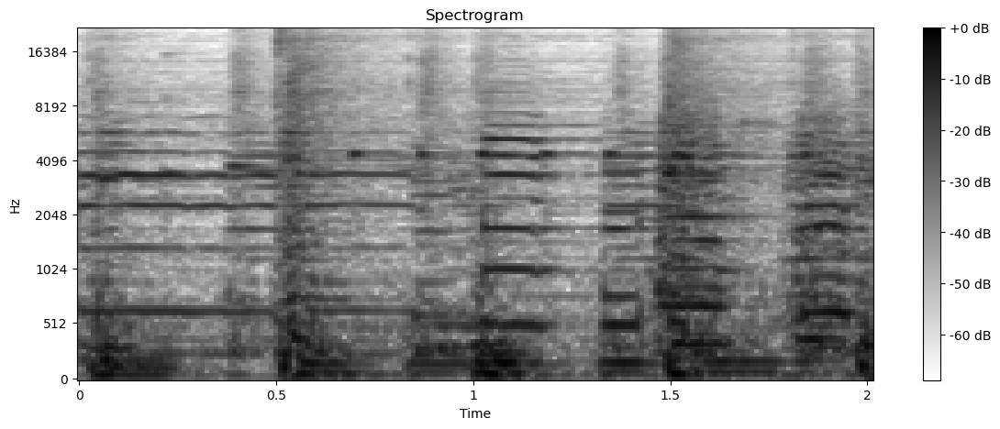

(128, 174)


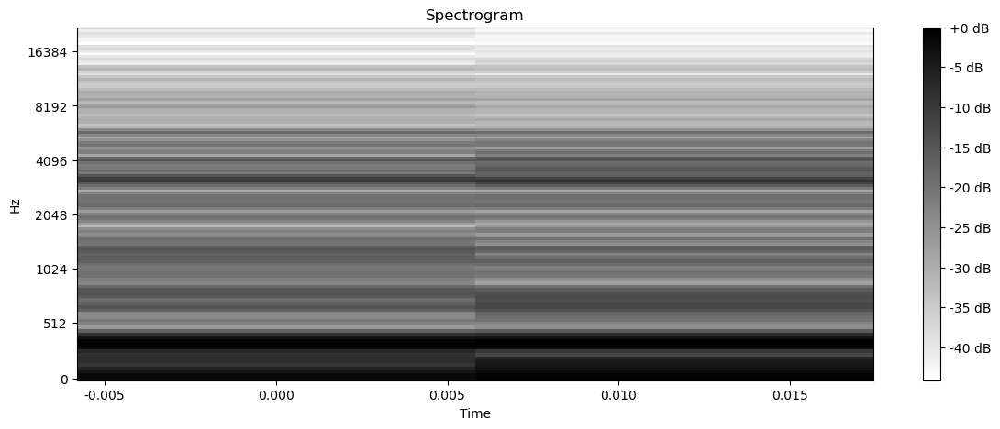

(128, 2)


In [30]:
plot_melspectogram_chunks(random_file_name)

In [31]:
128 * 345

44160

In [32]:
210 * 210

44100

# Data PreProcessing

In [ ]:
data_dir = r".cache\kagglehub\datasets\andradaolteanu\gtzan-dataset-music-genre-classification\versions\1\Data\genres_original"
classes = ['blues',  'classical',  'country',  'disco',  'hiphop',  'jazz',	'metal',  'pop',  'reggae',  'rock']

In [82]:
from tensorflow.image import resize

# load and preprocess audio data
def load_and_preprocess_data(data_dir, classes, target_shape=(210,210)):
  data=[]
  labels=[]

  for i_class, class_name in enumerate(classes):
    class_dir = os.path.join(data_dir, class_name)
    print("Processing--", class_name)
    for file_name in os.listdir(class_dir):
      file_path = os.path.join(class_dir, file_name)

      try:
        audio_data, sampling_rate = librosa.load(file_path, sr=None)
        #Perform PreProcessing
        chunck_duration = 4
        overlap_duration = 2
        chunk_samples = int(chunck_duration * sampling_rate)
        overlap_samples = int(overlap_duration * sampling_rate)

        num_chunks = int(np.ceil(len(audio_data) / (chunk_samples - overlap_samples)))

        for i in range(num_chunks):
          start_sample = i * (chunk_samples - overlap_samples)
          end_sample = start_sample + chunk_samples
          chunk = audio_data[start_sample:end_sample]

          mel_spectogram = librosa.feature.melspectrogram(y=chunk, sr=sampling_rate, n_mels=128, fmax=8000)
          #resize the matric to 150,150
          mel_spectogram = resize(tf.expand_dims(mel_spectogram, axis=-1), target_shape)
          #Append data to list
          data.append(mel_spectogram)
          labels.append(i_class)
      except Exception as e:
        print(f"Error processing file {file_path}: {e}")

  return np.array(data), np.array(labels)

In [35]:
data, labels = load_and_preprocess_data(data_dir, classes)

Processing-- blues
Processing-- classical
Processing-- country
Processing-- disco
Processing-- hiphop
Processing-- jazz
Error processing file C:\Users\KodavatiGeetanjali\.cache\kagglehub\datasets\andradaolteanu\gtzan-dataset-music-genre-classification\versions\1\Data\genres_original\jazz\jazz.00054.wav: 
Processing-- metal
Processing-- pop
Processing-- reggae
Processing-- rock


In [36]:
data.shape

(15974, 210, 210, 1)

In [37]:
labels.shape

(15974,)

In [38]:
from tensorflow.keras.utils import to_categorical
labels = to_categorical(labels, num_classes = len(classes)) # Converting to One Hot Encoding
labels

array([[1., 0., 0., ..., 0., 0., 0.],
       [1., 0., 0., ..., 0., 0., 0.],
       [1., 0., 0., ..., 0., 0., 0.],
       ...,
       [0., 0., 0., ..., 0., 0., 1.],
       [0., 0., 0., ..., 0., 0., 1.],
       [0., 0., 0., ..., 0., 0., 1.]])

In [39]:
labels.shape

(15974, 10)

# Train Test Split

In [40]:
from sklearn.model_selection import train_test_split

X_train, X_test, Y_train, Y_test = train_test_split(data, labels, test_size=0.2, random_state=42)

In [41]:
X_train.shape, X_test.shape, Y_train.shape, Y_test.shape

((12779, 210, 210, 1), (3195, 210, 210, 1), (12779, 10), (3195, 10))

# Building the Model

In [42]:
model = tf.keras.Sequential()

In [43]:
X_train[0].shape

(210, 210, 1)

In [44]:
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Flatten, Dense, Dropout

model.add(Conv2D(filters=32,kernel_size=3,padding='same',activation='relu', input_shape=(210,210,1)))
model.add(Conv2D(filters=32,kernel_size=3,activation='relu'))
model.add(MaxPooling2D(pool_size=2, strides=2))

In [45]:
model.add(Conv2D(filters=64,kernel_size=3,padding='same',activation='relu'))
model.add(Conv2D(filters=64,kernel_size=3,activation='relu'))
model.add(MaxPooling2D(pool_size=2, strides=2))

In [46]:
model.add(Conv2D(filters=128,kernel_size=3,padding='same',activation='relu'))
model.add(Conv2D(filters=128,kernel_size=3,activation='relu'))
model.add(MaxPooling2D(pool_size=2, strides=2))

In [47]:
model.add(Dropout(0.3))

In [48]:
model.add(Conv2D(filters=256,kernel_size=3,padding='same',activation='relu'))
model.add(Conv2D(filters=256,kernel_size=3,activation='relu'))
model.add(MaxPooling2D(pool_size=2, strides=2))

In [49]:
model.add(Conv2D(filters=512,kernel_size=3,padding='same',activation='relu'))
model.add(Conv2D(filters=512,kernel_size=3,activation='relu'))
model.add(MaxPooling2D(pool_size=2, strides=2))

In [50]:
model.add(Dropout(0.3))

In [51]:
model.add(Flatten())
model.add(Dense(units=12000, activation='relu'))
model.add(Dropout(0.45))
model.add(Dense(10, activation='softmax'))

In [52]:
model.summary()

Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv2d (Conv2D)                 │ (None, 210, 210, 32)   │           320 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_1 (Conv2D)               │ (None, 208, 208, 32)   │         9,248 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d (MaxPooling2D)    │ (None, 104, 104, 32)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_2 (Conv2D)               │ (None, 104, 104, 64)   │        18,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_3 (Conv2D)               │ (None, 102, 102, 64)   │        36,928 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_1 (MaxPooling2D)  │ (None, 51, 51, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_4 (Conv2D)               │ (None, 51, 51, 128)    │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_5 (Conv2D)               │ (None, 49, 49, 128)    │       147,584 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_2 (MaxPooling2D)  │ (None, 24, 24, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout (Dropout)               │ (None, 24, 24, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_6 (Conv2D)               │ (None, 24, 24, 256)    │       295,168 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_7 (Conv2D)               │ (None, 22, 22, 256)    │       590,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_3 (MaxPooling2D)  │ (None, 11, 11, 256)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_8 (Conv2D)               │ (None, 11, 11, 512)    │     1,180,160 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_9 (Conv2D)               │ (None, 9, 9, 512)      │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_4 (MaxPooling2D)  │ (None, 4, 4, 512)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_1 (Dropout)             │ (None, 4, 4, 512)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten (Flatten)               │ (None, 8192)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 12000)          │    98,316,000 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_2 (Dropout)             │ (None, 12000)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 10)             │       120,010 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 103,147,658 (393.48 MB)

 Trainable params: 103,147,658 (393.48 MB)

 Non-trainable params: 0 (0.00 B)

In [53]:
from tensorflow.keras.optimizers import Adam

# Compile the Model
model.compile(
    optimizer=Adam(learning_rate=0.0001),  # Pass learning rate here
    loss='categorical_crossentropy',
    metrics=['accuracy']  # Correct the metric name
)

In [54]:
training_history = model.fit(X_train, Y_train, batch_size=32, epochs=30, validation_data=(X_test, Y_test))

Epoch 1/30
400/400 ━━━━━━━━━━━━━━━━━━━━ 1183s 3s/step - accuracy: 0.2676 - loss: 2.0282 - val_accuracy: 0.4867 - val_loss: 1.4959
Epoch 2/30
400/400 ━━━━━━━━━━━━━━━━━━━━ 1175s 3s/step - accuracy: 0.5613 - loss: 1.2808 - val_accuracy: 0.6304 - val_loss: 1.0816
Epoch 3/30
400/400 ━━━━━━━━━━━━━━━━━━━━ 1121s 3s/step - accuracy: 0.6591 - loss: 0.9913 - val_accuracy: 0.6782 - val_loss: 0.9213
Epoch 4/30
400/400 ━━━━━━━━━━━━━━━━━━━━ 1095s 3s/step - accuracy: 0.7261 - loss: 0.7900 - val_accuracy: 0.7505 - val_loss: 0.7201
Epoch 5/30
400/400 ━━━━━━━━━━━━━━━━━━━━ 1205s 3s/step - accuracy: 0.7815 - loss: 0.6395 - val_accuracy: 0.7505 - val_loss: 0.7095
Epoch 6/30
400/400 ━━━━━━━━━━━━━━━━━━━━ 1532s 4s/step - accuracy: 0.8144 - loss: 0.5415 - val_accuracy: 0.7915 - val_loss: 0.6247
Epoch 7/30
400/400 ━━━━━━━━━━━━━━━━━━━━ 1442s 4s/step - accuracy: 0.8532 - loss: 0.4262 - val_accuracy: 0.8225 - val_loss: 0.5257
Epoch 8/30
400/400 ━━━━━━━━━━━━━━━━━━━━ 1298s 3s/step - accuracy: 0.8701 - loss: 0.3705 - 

In [81]:
model.save("Trained_model.h5")

In [80]:
#Reloading model variable
model = tf.keras.models.load_model("Trained_model.h5")
model.summary()

Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv2d (Conv2D)                 │ (None, 210, 210, 32)   │           320 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_1 (Conv2D)               │ (None, 208, 208, 32)   │         9,248 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d (MaxPooling2D)    │ (None, 104, 104, 32)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_2 (Conv2D)               │ (None, 104, 104, 64)   │        18,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_3 (Conv2D)               │ (None, 102, 102, 64)   │        36,928 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_1 (MaxPooling2D)  │ (None, 51, 51, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_4 (Conv2D)               │ (None, 51, 51, 128)    │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_5 (Conv2D)               │ (None, 49, 49, 128)    │       147,584 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_2 (MaxPooling2D)  │ (None, 24, 24, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout (Dropout)               │ (None, 24, 24, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_6 (Conv2D)               │ (None, 24, 24, 256)    │       295,168 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_7 (Conv2D)               │ (None, 22, 22, 256)    │       590,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_3 (MaxPooling2D)  │ (None, 11, 11, 256)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_8 (Conv2D)               │ (None, 11, 11, 512)    │     1,180,160 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_9 (Conv2D)               │ (None, 9, 9, 512)      │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_4 (MaxPooling2D)  │ (None, 4, 4, 512)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_1 (Dropout)             │ (None, 4, 4, 512)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten (Flatten)               │ (None, 8192)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 12000)          │    98,316,000 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_2 (Dropout)             │ (None, 12000)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 10)             │       120,010 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 103,147,660 (393.48 MB)

 Trainable params: 103,147,658 (393.48 MB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 2 (12.00 B)

In [56]:
training_history.history

{'accuracy': [0.36262619495391846,
  0.5813443660736084,
  0.6747006773948669,
  0.7341732382774353,
  0.7795602083206177,
  0.8244776725769043,
  0.8553094863891602,
  0.8681430220603943,
  0.8926363587379456,
  0.9048438668251038,
  0.9122779369354248,
  0.927928626537323,
  0.9332498908042908,
  0.9350497126579285,
  0.9431880712509155,
  0.9490570425987244,
  0.9503090977668762,
  0.942014217376709,
  0.9561781287193298,
  0.9570388793945312,
  0.9658815264701843,
  0.9608733057975769,
  0.959542989730835,
  0.964942455291748,
  0.9691681861877441,
  0.9667423367500305,
  0.9663510322570801,
  0.9701854586601257,
  0.9725330471992493,
  0.9737851023674011],
 'loss': [1.7942001819610596,
  1.2098500728607178,
  0.9593157172203064,
  0.7724556922912598,
  0.6441969275474548,
  0.51193767786026,
  0.42113956809043884,
  0.37972182035446167,
  0.3023100197315216,
  0.27667340636253357,
  0.256952702999115,
  0.20311671495437622,
  0.19418154656887054,
  0.1843990534543991,
  0.16196301

In [59]:
#Recording History in json
import json
with open('training_hist.json','w') as f:
    training_history_data = json.dump(json_file)

# Model Evaluation

In [61]:
#Model Evalaution on Training Set
training_loss, training_accuracy = model.evaluate(X_train, Y_train)

400/400 ━━━━━━━━━━━━━━━━━━━━ 249s 611ms/step - accuracy: 0.9821 - loss: 0.0457


In [62]:
training_loss, training_accuracy

(0.04571951925754547, 0.9819234609603882)

In [63]:
#Model Evaluation on Validation Set
val_loss, val_accuracy = model.evaluate(X_test, Y_test)

100/100 ━━━━━━━━━━━━━━━━━━━━ 73s 728ms/step - accuracy: 0.8687 - loss: 0.6222


In [64]:
val_loss, val_accuracy

(0.604417085647583, 0.8738654255867004)

In [68]:
import json
with open("training_hist.json",'r') as json_file:
    training_history_data = json.load(json_file)

In [71]:
y_pred = model.predict(X_test)
y_pred

100/100 ━━━━━━━━━━━━━━━━━━━━ 57s 568ms/step


array([[3.1909155e-09, 7.7542062e-10, 6.3096770e-08, ..., 1.1302345e-11,
        3.4886094e-09, 4.7905164e-09],
       [9.3201083e-07, 9.9962819e-01, 3.1358308e-05, ..., 5.1017146e-06,
        1.5406027e-04, 4.0769983e-06],
       [1.3849023e-10, 2.9710538e-13, 5.2409241e-09, ..., 1.2279376e-08,
        8.9573146e-13, 4.2715724e-06],
       ...,
       [1.6081379e-06, 1.3765747e-12, 1.4893015e-01, ..., 1.1933198e-06,
        3.3383103e-08, 8.4079689e-01],
       [4.5619659e-06, 9.8725368e-12, 2.2780987e-05, ..., 9.9392867e-01,
        3.6578538e-07, 2.3473923e-04],
       [1.0000000e+00, 8.3363424e-15, 6.4762750e-14, ..., 3.5709186e-16,
        4.0850052e-13, 9.9197422e-19]], dtype=float32)

In [72]:
y_pred.shape

(3195, 10)

In [73]:
predicted_categories = np.argmax(y_pred, axis=1)
predicted_categories

array([5, 1, 6, ..., 9, 7, 0], dtype=int64)

In [74]:
Y_test

array([[0., 0., 0., ..., 0., 0., 0.],
       [0., 1., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       ...,
       [0., 0., 0., ..., 0., 0., 1.],
       [0., 0., 0., ..., 1., 0., 0.],
       [1., 0., 0., ..., 0., 0., 0.]])

In [76]:
true_categories = np.argmax(Y_test, axis=1)
true_categories

array([5, 1, 6, ..., 9, 7, 0], dtype=int64)

In [75]:
classes

['blues',
 'classical',
 'country',
 'disco',
 'hiphop',
 'jazz',
 'metal',
 'pop',
 'reggae',
 'rock']

In [77]:
from sklearn.metrics import classification_report

print(classification_report(true_categories, predicted_categories, target_names=classes))

              precision    recall  f1-score   support

       blues       0.80      0.88      0.84       308
   classical       0.90      0.93      0.92       304
     country       0.81      0.84      0.83       335
       disco       0.94      0.83      0.88       332
      hiphop       0.92      0.87      0.89       300
        jazz       0.87      0.93      0.90       350
       metal       0.87      0.94      0.90       331
         pop       0.86      0.88      0.87       327
      reggae       0.96      0.86      0.91       307
        rock       0.83      0.76      0.80       301

    accuracy                           0.87      3195
   macro avg       0.88      0.87      0.87      3195
weighted avg       0.88      0.87      0.87      3195



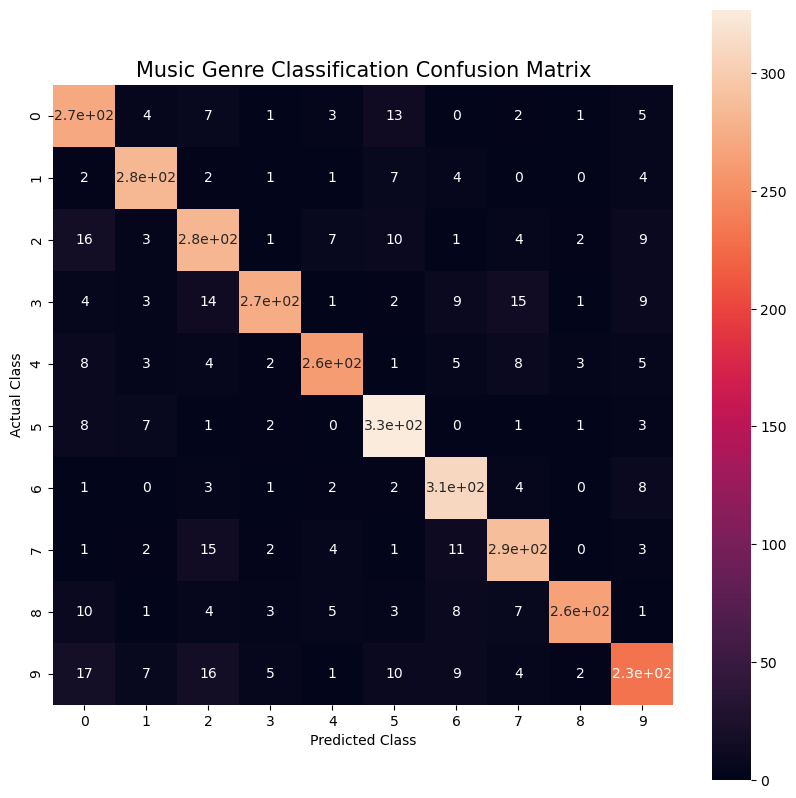

In [78]:
from sklearn.metrics import confusion_matrix
import seaborn as sns

cm = confusion_matrix(true_categories, predicted_categories)
plt.figure(figsize=(10,10))
sns.heatmap(cm, annot=True, annot_kws={"size":10}, square=True)
plt.xlabel("Predicted Class", fontsize=10)
plt.ylabel("Actual Class", fontsize=10)
plt.title("Music Genre Classification Confusion Matrix", fontsize=15)
plt.show()

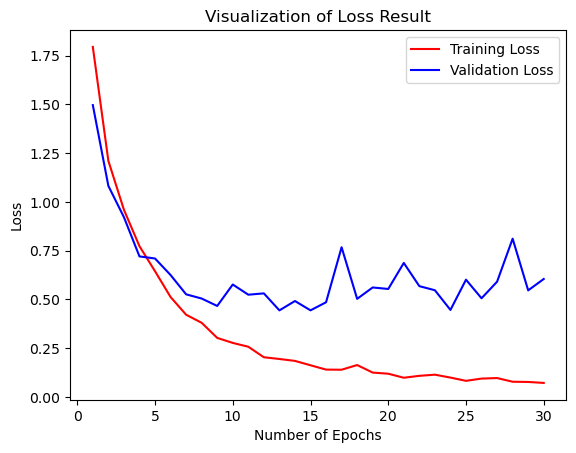

In [69]:
#Visualization of Loss
epochs = [i for i in range(1,31)]
plt.plot(epochs, training_history_data['loss'], label="Training Loss", color='red')
plt.plot(epochs, training_history_data['val_loss'], label="Validation Loss", color='blue')
plt.xlabel("Number of Epochs")
plt.ylabel("Loss")
plt.title("Visualization of Loss Result")
plt.legend()
plt.show()

# Loss And Accuracy Visualization

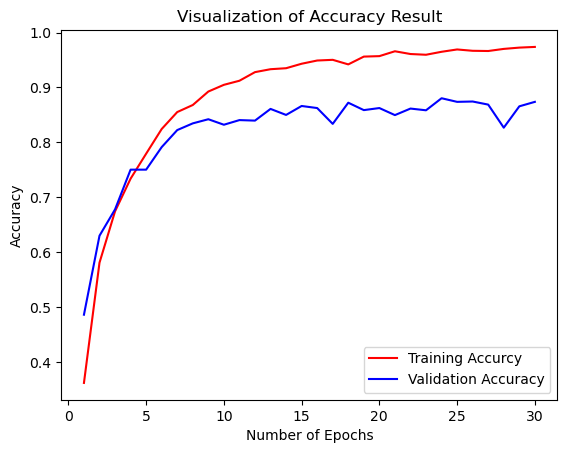

In [70]:
#Visualization of Accuracy
epochs = [i for i in range(1,31)]
plt.plot(epochs, training_history_data['accuracy'], label="Training Accurcy", color='red')
plt.plot(epochs, training_history_data['val_accuracy'], label="Validation Accuracy", color='blue')
plt.xlabel("Number of Epochs")
plt.ylabel("Accuracy")
plt.title("Visualization of Accuracy Result")
plt.legend()
plt.show()